In [6]:
import pandas as pd
import networkx as nx
from fa2 import ForceAtlas2
import collections
import matplotlib.pyplot as plt
from operator import itemgetter
import community
import copy

In [7]:
forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=True,  # Dissuade hubs
                        linLogMode=False,  # NOT IMPLEMENTED
                        adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                        edgeWeightInfluence=3.0,

                        # Performance
                        jitterTolerance=1.0,  # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=1.2,
                        multiThreaded=False,  # NOT IMPLEMENTED

                        # Tuning
                        scalingRatio=45.0,
                        strongGravityMode=True,
                        gravity=10.0,

                        # Log
                        verbose=True)

In [8]:
#G=nx.from_pandas_edgelist(pd.read_csv("links_tot_sorted.csv", header=None), source=0, target=1)
G=nx.from_pandas_edgelist(pd.read_csv("links_tot_EN.csv", header=None), source=0, target=1)

In [9]:
len(G.nodes) # sarebbero dovuti essere 4831 ... da controllare ...

4954

In [10]:
len(G.edges)

13806

In [11]:
for e in G.edges:
#     print(e)
#     print(G.get_edge_data(e[0],e[1]))
    G[e[0]][e[1]]['weight'] = 1
#     print(e)
#     print(G.get_edge_data(e[0],e[1]))
#     break

### Degree Distribution

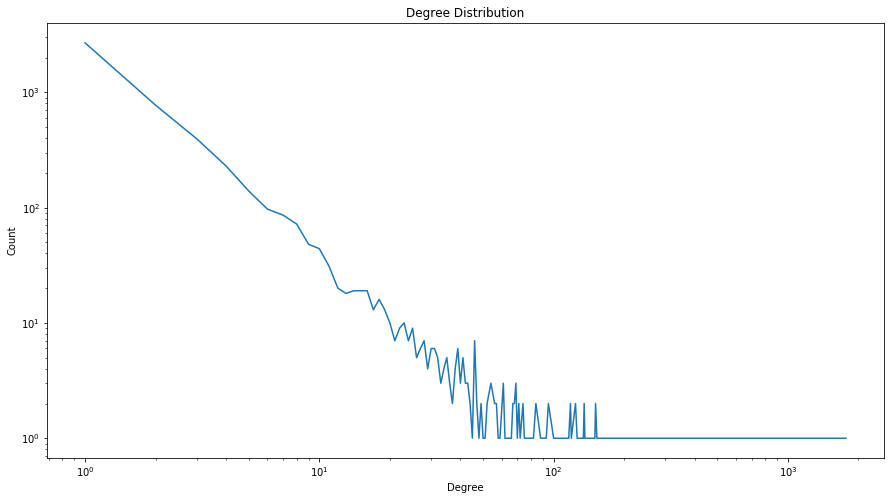

In [12]:
degree_sequence = sorted([d for n, d in G.degree()], reverse=True)  # degree sequence

degreeCount = collections.Counter(degree_sequence)
deg, cnt = zip(*degreeCount.items())

fig, ax = plt.subplots(figsize=(15, 8))

plt.title("Degree Distribution")
plt.ylabel("Count")
plt.xlabel("Degree")

plt.loglog(deg,cnt)

plt.show()

### Degree Centrality

Degree Centrality is used to identify the most influential persons on a social network for example.

In [13]:
degc = nx.degree_centrality(G)
sorted(degc.items(), key=itemgetter(1), reverse=True)[:10]

[('EU_ENV', 0.35735917625681407),
 ('PPFEnergia', 0.11427417726630325),
 ('GreenCogEU', 0.10680395719765799),
 ('arikring', 0.08277811427417726),
 ('EnergyDemand', 0.05875227135069655),
 ('EUEnvironment', 0.05794467999192409),
 ('euenergyweek', 0.048051685846961435),
 ('DrJoeNyangon', 0.04300423985463356),
 ('Albanian_Energy', 0.036341611144760755),
 ('Eurogas_Eu', 0.033716939228750256)]

### Betweenness centrality

Betweenness Centrality detects the amount of influence a node has over the flow of information in a graph.

It is often used to find nodes that serve as a bridge from one part of a graph to another, for example in the package delivery processor in a telecommunication network, or in the propagation of fake news.

In [14]:
bet = nx.betweenness_centrality(G) 
sorted(bet.items(), key=itemgetter(1), reverse=True)[:10]

[('EU_ENV', 0.4654339299460004),
 ('PPFEnergia', 0.11190886159053298),
 ('GreenCogEU', 0.10338806215486064),
 ('arikring', 0.09237504331197191),
 ('EUEnvironment', 0.052332255295452886),
 ('EnergyDemand', 0.040120771592792225),
 ('GreenNewsDaily', 0.03634166117468189),
 ('DrJoeNyangon', 0.035819494724688095),
 ('EU_Commission', 0.028723077576693987),
 ('Ed_Crooks', 0.025691077276512774)]

### Closeness centrality

Closeness Centrality detects nodes that are can spread information efficiently through a graph.

It can be used to identify fake news accounts or in terrorist cells to isolate the individuals that can spread information to the rest of the graph.

In [15]:
clos = nx.closeness_centrality(G)
sorted(clos.items(), key=itemgetter(1), reverse=True)[:10]

[('EU_ENV', 0.45679743530597844),
 ('EUEnvironment', 0.4439559051056217),
 ('EU_Commission', 0.43279967143384923),
 ('EU_ManagEnergy', 0.41875678138308986),
 ('EASE_ES', 0.41758934252310487),
 ('Eurogas_Eu', 0.4159378195427459),
 ('EGEC_geothermal', 0.41492529568085224),
 ('eurelectric', 0.41492529568085224),
 ('energycities', 0.41485564812807324),
 ('RenewablesGrid', 0.4074017182433028)]

### Eigenvector Centrality

Google's pagerank score is a variant of eigenvector centrality

Eigenvector Centrality is the number of walks of infinite length ending at node i.

This gives more importance to nodes with well-connected neighbors.

In [16]:
eig = nx.eigenvector_centrality(G)
sorted(eig.items(), key=itemgetter(1), reverse=True)[:10]

[('EU_ENV', 0.4911661159913068),
 ('EUEnvironment', 0.1620783819772391),
 ('PPFEnergia', 0.15588490994843984),
 ('GreenCogEU', 0.13667539991272892),
 ('Eurogas_Eu', 0.12541839944340347),
 ('euenergyweek', 0.12363475164167335),
 ('EU_ManagEnergy', 0.10520159359206067),
 ('energycities', 0.10091942986940074),
 ('EASE_ES', 0.0999448629217585),
 ('EU_Commission', 0.09770656064945618)]

### Union of Centralities

In [17]:
degc_top = [n[0] for n in sorted(degc.items(), key=itemgetter(1), reverse=True)[:2000]]
betc_top = [n[0] for n in sorted(bet.items(), key=itemgetter(1), reverse=True)[:2000]]
closc_top = [n[0] for n in sorted(clos.items(), key=itemgetter(1), reverse=True)[:2000]]
eigc_top = [n[0] for n in sorted(eig.items(), key=itemgetter(1), reverse=True)[:2000]]

In [18]:
central_nodes = set(degc_top + betc_top + closc_top + eigc_top)
len(central_nodes)

3143

In [19]:
#for plot labels
degc_top_sel = [n[0] for n in sorted(degc.items(), key=itemgetter(1), reverse=True)[:30]]
betc_top_sel = [n[0] for n in sorted(bet.items(), key=itemgetter(1), reverse=True)[:30]]
closc_top_sel = [n[0] for n in sorted(clos.items(), key=itemgetter(1), reverse=True)[:30]]
eigc_top_sel = [n[0] for n in sorted(eig.items(), key=itemgetter(1), reverse=True)[:30]]

central_nodes_labels = set(degc_top_sel + betc_top_sel + closc_top_sel + eigc_top_sel)
len(central_nodes_labels)

60

### Pruning

In [20]:
G_pruned_frozen = G.subgraph(central_nodes)
nx.is_frozen(G_pruned_frozen)

True

In [21]:
G_pruned = nx.Graph(G_pruned_frozen)
nx.is_frozen(G_pruned)

False

In [22]:
def get_disconnected_nodes(G):
    nodes_list = []
    for n_deg in G_pruned.degree:
        n = n_deg[0]
        deg = n_deg[1]
        if deg==0:
            nodes_list.append(n)
    return nodes_list

disconnected_nodes = get_disconnected_nodes(G_pruned)
disconnected_nodes

['EnelEnergiaHelp']

In [23]:
for n in disconnected_nodes:
    G_pruned.remove_node(n)

In [24]:
for e in G_pruned.edges:
#     print(e)
#     print(G.get_edge_data(e[0],e[1]))
    G_pruned[e[0]][e[1]]['weight'] = 1
#     print(e)
#     print(G.get_edge_data(e[0],e[1]))
#     break

In [25]:
len(G_pruned.nodes)

3142

In [26]:
len(G_pruned.edges)

11937

<function matplotlib.pyplot.show(*args, **kw)>

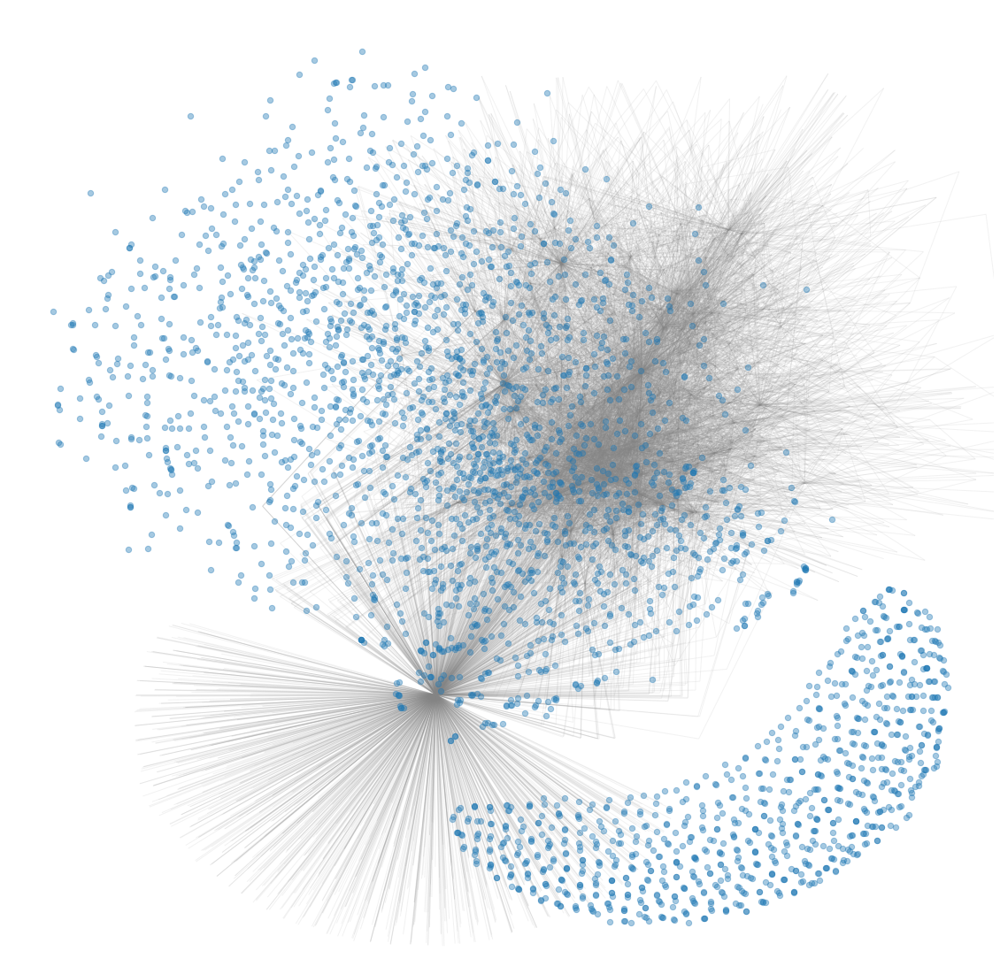

In [27]:
# nx.draw(G_pruned)
fig, ax = plt.subplots(figsize=(20, 20));
#fig, ax = plt.subplots();

nx.draw_networkx_nodes(G_pruned, pos=nx.spring_layout(G_pruned), node_size=40, with_labels=False, alpha=0.4)
nx.draw_networkx_edges(G_pruned, pos=nx.spring_layout(G_pruned), edge_color="gray", alpha=0.1)

plt.axis('off')
plt.show

In [28]:
# INDIVIDUA LE COMMUNITY DELLA RETE FILTRATA
partition_pruned = community.best_partition(G_pruned)
print("\nNumero di community della rete filtrata:",len(set(partition_pruned.values())))


Numero di community della rete filtrata: 8


In [29]:
# CREAZIONE DI UNA COPIA DEL GRAFO FILTRATO IN CUI IL PESO
# DEI LINK INTERNI ALLE COMMUNITY VIENE RADDOPPIATO PER 
# MIGLIORARE I LAYOUT CON FORCE-ATLAS
myG_pruned_COPY4PLOT = copy.deepcopy(G_pruned)
for e in G_pruned.edges():
    if partition_pruned[e[0]]==partition_pruned[e[1]]:
        myG_pruned_COPY4PLOT[e[0]][e[1]]['weight'] = G_pruned[e[0]][e[1]]['weight'] * 2 #2.5

# CREAZIONE DEL PLOT DEL GRAFO
#fig, pos = plot_network_new(myG_pruned_COPY4PLOT, d_screen_names, partition_pruned, pagerank_json)

100%|██████████| 2000/2000 [00:53<00:00, 37.64it/s]


BarnesHut Approximation  took  17.36  seconds
Repulsion forces  took  31.94  seconds
Gravitational forces  took  0.03  seconds
Attraction forces  took  1.51  seconds
AdjustSpeedAndApplyForces step  took  1.10  seconds


<function matplotlib.pyplot.show(*args, **kw)>

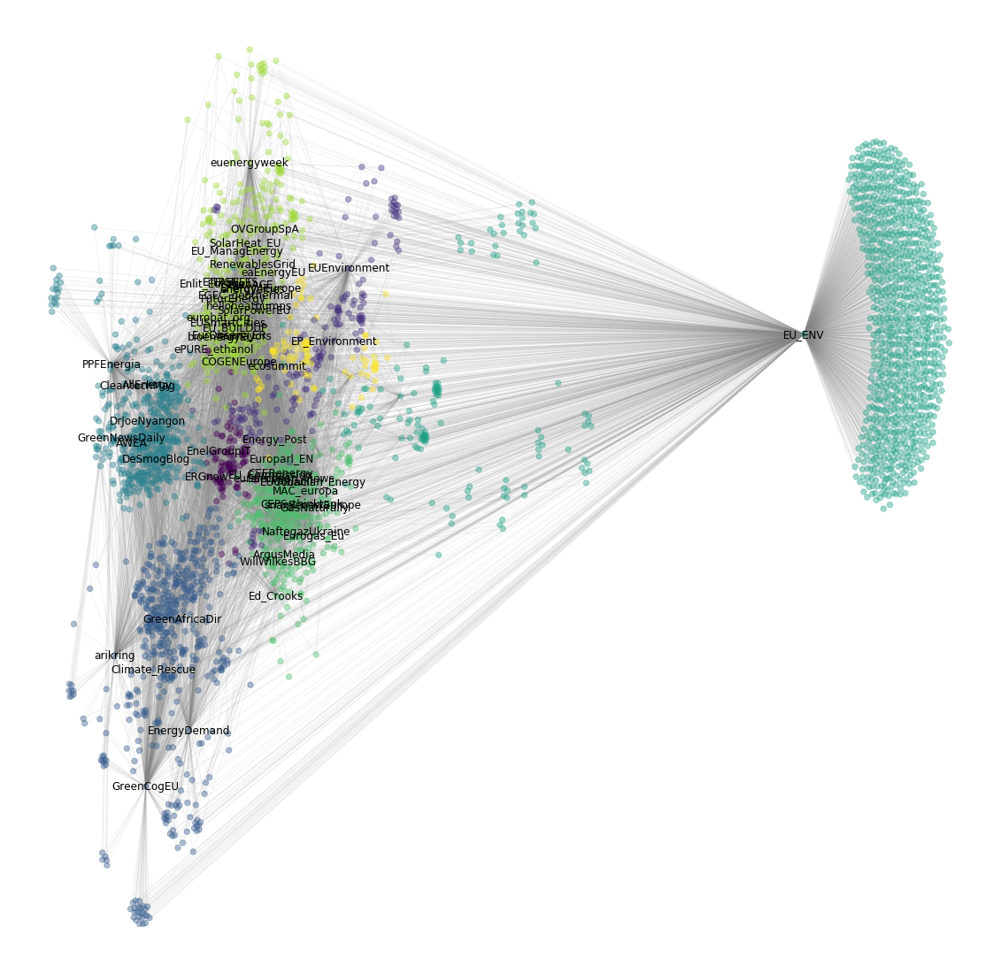

In [30]:
# definisce i colori dei nodi in base alla partizione del grafo  
colors = [partition_pruned[n] for n in G_pruned.nodes()]

# definisce la size dei nodi in base al pagerank  
#     node_sizes = [pagerank['pagerank'][twitter_id_screen_names[n]] * 1000 for n in G.nodes()]

# seleziona le label dei nodi da visualizzare
node_labels = {}
for n in G_pruned.nodes():
    if n in central_nodes_labels:
        node_labels[n] = n
    else:
        node_labels[n] = ''

#positions = forceatlas2.forceatlas2_networkx_layout(myG_pruned_COPY4PLOT, pos=None, iterations=2000)
positions = forceatlas2.forceatlas2_networkx_layout(myG_pruned_COPY4PLOT, pos=None, iterations=2000)

fig, ax = plt.subplots(figsize=(20, 20));
# fig, ax = plt.subplots(figsize=(50, 50));
#fig, ax = plt.subplots()


nx.draw_networkx_nodes(G_pruned, positions, node_size=40, with_labels=False, node_color=colors, alpha=0.4)
nx.draw_networkx_edges(G_pruned, positions, edge_color="gray", alpha=0.1)
nx.draw_networkx_labels(G_pruned, positions, labels=node_labels)
plt.axis('off')
plt.savefig("NW_en.png", dpi=72)
plt.show

100%|██████████| 2000/2000 [00:57<00:00, 34.53it/s]


BarnesHut Approximation  took  24.86  seconds
Repulsion forces  took  29.26  seconds
Gravitational forces  took  0.03  seconds
Attraction forces  took  1.49  seconds
AdjustSpeedAndApplyForces step  took  1.12  seconds


<function matplotlib.pyplot.show(*args, **kw)>

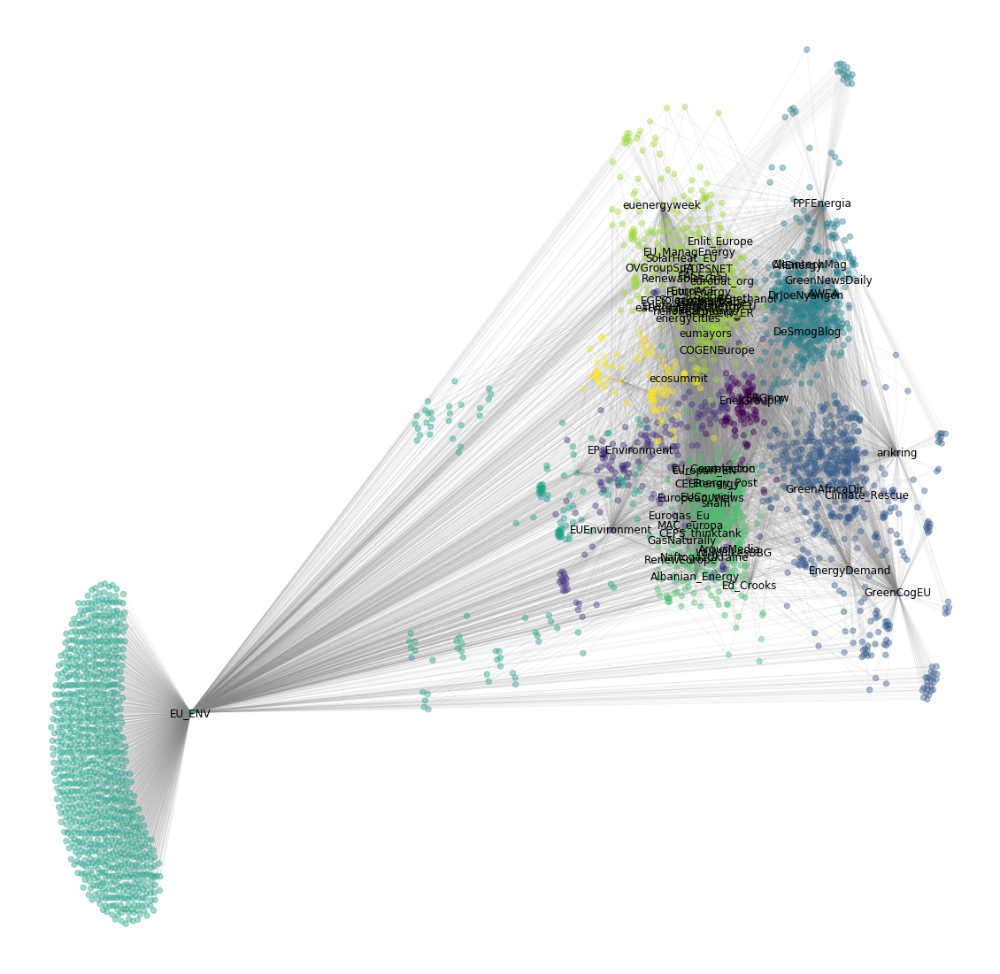

In [31]:
# definisce i colori dei nodi in base alla partizione del grafo  
colors = [partition_pruned[n] for n in G_pruned.nodes()]

# definisce la size dei nodi in base al pagerank  
#     node_sizes = [pagerank['pagerank'][twitter_id_screen_names[n]] * 1000 for n in G.nodes()]

# seleziona le label dei nodi da visualizzare
node_labels = {}
for n in G_pruned.nodes():
    if n in central_nodes_labels:
        node_labels[n] = n
    else:
        node_labels[n] = ''

#positions = forceatlas2.forceatlas2_networkx_layout(myG_pruned_COPY4PLOT, pos=None, iterations=2000)
positions = forceatlas2.forceatlas2_networkx_layout(myG_pruned_COPY4PLOT, pos=None, iterations=2000)

fig, ax = plt.subplots(figsize=(20, 20));
# fig, ax = plt.subplots(figsize=(50, 50));
#fig, ax = plt.subplots()


nx.draw_networkx_nodes(G_pruned, positions, node_size=40, with_labels=False, node_color=colors, alpha=0.4)
nx.draw_networkx_edges(G_pruned, positions, edge_color="gray", alpha=0.1)
nx.draw_networkx_labels(G_pruned, positions, labels=node_labels)
plt.axis('off')
plt.savefig("NW_en.png", dpi=72)
plt.show

In [32]:
# partition_pruned

In [33]:
import json

with open('Partition_pruned_EN.json', 'w') as fp:
    json.dump(partition_pruned, fp, sort_keys=True, indent=4)

In [34]:
!pip install plotly

Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


In [35]:
# import plotly.plotly as py
# from plotly.graph_objs import *

In [36]:
!pip install chart_studio

Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


In [37]:
import chart_studio.plotly as py
# from plotly.graph_objs import *
import plotly.graph_objects as go


In [38]:
# vedi: https://plotly.com/python/network-graphs/

# Xv=[pos[k][0] for k in range(N)]
# Yv=[pos[k][1] for k in range(N)]
# Xed=[]
# Yed=[]
# for edge in E:
#     Xed+=[pos[edge[0]][0],pos[edge[1]][0], None]
#     Yed+=[pos[edge[0]][1],pos[edge[1]][1], None]

# trace3=Scatter(x=Xed,
#                y=Yed,
#                mode='lines',
#                line=dict(color='rgb(210,210,210)', width=1),
#                hoverinfo='none'
#                )
# trace4=Scatter(x=Xv,
#                y=Yv,
#                mode='markers',
#                name='net',
#                marker=dict(symbol='circle-dot',
#                              size=5,
#                              color='#6959CD',
#                              line=dict(color='rgb(50,50,50)', width=0.5)
#                              ),
#                text=labels,
#                hoverinfo='text'
#                )

# annot="This networkx.Graph has the Fruchterman-Reingold layout<br>Code:"+\
# "<a href='http://nbviewer.ipython.org/gist/empet/07ea33b2e4e0b84193bd'> [2]</a>"

# data1=[trace3, trace4]
# fig1=Figure(data=data1, layout=layout)
# fig1['layout']['annotations'][0]['text']=annot
# py.iplot(fig1, filename='Coautorship-network-nx')

In [39]:
# VEDi: https://plotly.com/python/getting-started-with-chart-studio/
def draw_nw_with_plotly(G):
    edge_x = []
    edge_y = []
    for edge in G.edges():
        x0, y0 = positions[edge[0]]
        x1, y1 = positions[edge[1]]
        edge_x.append(x0)
        edge_x.append(x1)
        edge_x.append(None)
        edge_y.append(y0)
        edge_y.append(y1)
        edge_y.append(None)

    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=0.5, color='#888'),
        hoverinfo='none',
        mode='lines')

    node_x = []
    node_y = []
    for node in G.nodes():
        x, y = positions[node]
        node_x.append(x)
        node_y.append(y)

    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers',
        hoverinfo='text',
        marker=dict(
            showscale=True,
            # colorscale options
            #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
            #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
            #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
            colorscale='YlGnBu',
            reversescale=True,
            color=[],
            size=10,
            colorbar=dict(
                thickness=15,
                title='Node Connections',
                xanchor='left',
                titleside='right'
            ),
            line_width=2))
    
    fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                title='<br>Network graph made with Python',
                titlefont_size=16,
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                annotations=[ dict(
                    text="Python code: <a href='https://plotly.com/ipython-notebooks/network-graphs/'> https://plotly.com/ipython-notebooks/network-graphs/</a>",
                    showarrow=False,
                    xref="paper", yref="paper",
                    x=0.005, y=-0.002 ) ],
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )
    
    fig.show()
    
draw_nw_with_plotly(G_pruned)

In [40]:
#G_pruned.nodes

In [41]:
#G_pruned.edges

In [42]:
# import operator
# sorted_x = sorted(dict(G_pruned.degree).items(), key=operator.itemgetter(1))
# sorted_x

In [45]:
filename = "G_pruned_nodes_final.csv"

file = open(filename,'w')

for n in list(G_pruned.nodes):
    file.write(n+'\n')
file.close()